In [1]:
from datetime import datetime
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import pandas as pd
from pathlib import Path
from keras import Sequential
from keras.layers import LSTM, Dense
from matplotlib import pyplot
import numpy as np
from math import sqrt
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from prophet import Prophet
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

In [2]:
import platform
if platform.system() == 'Darwin':
    data_path = Path('../data')
else:
    data_path = Path('C:/Users/USER/Desktop/TUWien/Data Science/194.049 Energy-efficient Distributed Systems/Project2021/Assigment2/data')

In [3]:
data = pd.read_csv(data_path / 'pollution.csv')
cols = ["date", "pollution"]
data = data[cols]

In [4]:
data.columns=['ds','y']

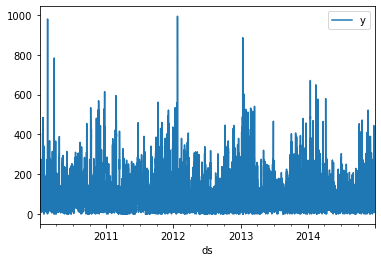

In [5]:
data['ds']=pd.to_datetime(data.ds)
data.plot(x='ds',y='y')

In [6]:
def split(dataset,horizon_size):
    train = dataset.iloc[0:-horizon_size,:]
    test = dataset.iloc[-horizon_size:,:]
    print(len(train), len(test))
    return(train,test)

1 month 

In [29]:
train, test = split(data, 30*24)
train1 = train.iloc[:1000]
train2 = train.iloc[:10000]

43080 720


In [12]:
%%time
m=Prophet(seasonality_mode='multiplicative')
m.fit(train)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 5min 26s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-12-02 00:00:00,104.611757,41.016568,259.060434,104.611757,104.611757,0.137223,0.137223,0.137223,0.433620,...,-0.049762,-0.049762,-0.049762,0.346159,0.346159,0.346159,0.0,0.0,0.0,149.973460
1,2014-12-02 01:00:00,104.612838,22.498345,267.754272,104.612838,104.612838,0.136027,0.136027,0.136027,0.434701,...,-0.047330,-0.047330,-0.047330,0.346003,0.346003,0.346003,0.0,0.0,0.0,150.088109
2,2014-12-02 02:00:00,104.613919,39.546604,257.691785,104.613919,104.613919,0.122858,0.122858,0.122858,0.423768,...,-0.044928,-0.044928,-0.044928,0.345838,0.345838,0.345838,0.0,0.0,0.0,148.945959
3,2014-12-02 03:00:00,104.615000,31.358137,262.088852,104.615000,104.615000,0.093525,0.093525,0.093525,0.396615,...,-0.042574,-0.042574,-0.042574,0.345664,0.345664,0.345664,0.0,0.0,0.0,146.106894
4,2014-12-02 04:00:00,104.616081,25.530867,254.850045,104.616081,104.616081,0.053004,0.053004,0.053004,0.358203,...,-0.040282,-0.040282,-0.040282,0.345481,0.345481,0.345481,0.0,0.0,0.0,142.089887


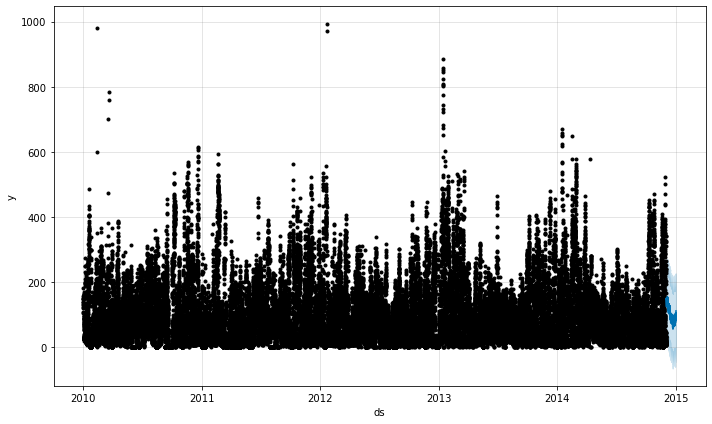

In [13]:
m.plot(forecast, uncertainty=True)
plt.show()

In [14]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

97.46994989542446

In [15]:
%%time
m=Prophet(seasonality_mode='multiplicative')
m.fit(train1)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
Wall time: 40.1 s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-12-02 00:00:00,6109.624773,-376549.947049,395793.857498,-199056.766958,209244.274388,0.240772,0.240772,0.240772,0.891501,0.891501,0.891501,0.650729,0.650729,0.650729,0.0,0.0,0.0,11556.362345
1,2014-12-02 01:00:00,6109.767642,-382328.066139,401850.406302,-199064.261148,209248.185611,0.252290,0.252290,0.252290,0.920407,0.920407,0.920407,0.668118,0.668118,0.668118,0.0,0.0,0.0,11733.243148
2,2014-12-02 02:00:00,6109.910510,-381727.512790,401172.061080,-199071.755338,209252.096834,0.233868,0.233868,0.233868,0.917308,0.917308,0.917308,0.683440,0.683440,0.683440,0.0,0.0,0.0,11714.579975
3,2014-12-02 03:00:00,6110.053379,-369704.738867,388634.837051,-199079.249528,209256.008057,0.160342,0.160342,0.160342,0.856835,0.856835,0.856835,0.696492,0.696492,0.696492,0.0,0.0,0.0,11345.358946
4,2014-12-02 04:00:00,6110.196248,-349032.658646,366769.562619,-199086.743718,209259.919280,0.045950,0.045950,0.045950,0.753036,0.753036,0.753036,0.707086,0.707086,0.707086,0.0,0.0,0.0,10711.396911


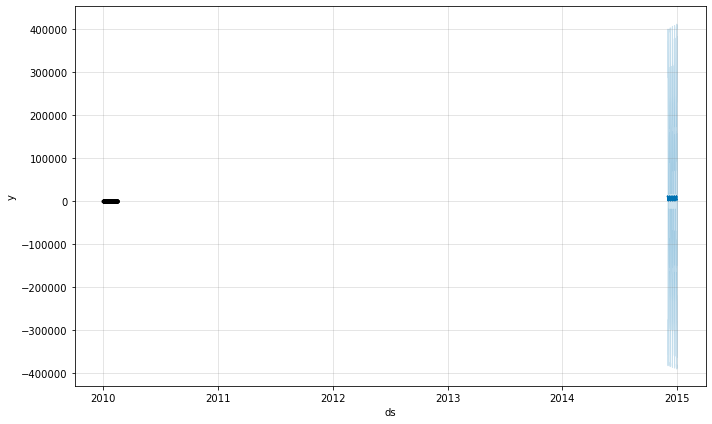

In [16]:
m.plot(forecast, uncertainty=True)
plt.show()

In [17]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

6839.948339663629

In [30]:
%%time
m=Prophet(seasonality_mode='multiplicative')
m.fit(train2)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
Wall time: 16.4 s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-12-02 00:00:00,27.412603,-1759.758804,1870.774634,-1459.659127,1574.942739,0.182107,0.182107,0.182107,0.193511,0.193511,0.193511,0.011404,0.011404,0.011404,0.0,0.0,0.0,32.717249
1,2014-12-02 01:00:00,27.410459,-1745.233235,1921.219492,-1459.703732,1574.988222,0.176645,0.176645,0.176645,0.192435,0.192435,0.192435,0.015790,0.015790,0.015790,0.0,0.0,0.0,32.685187
2,2014-12-02 02:00:00,27.408314,-1692.024633,1868.756031,-1459.748337,1575.033705,0.153156,0.153156,0.153156,0.173076,0.173076,0.173076,0.019921,0.019921,0.019921,0.0,0.0,0.0,32.152042
3,2014-12-02 03:00:00,27.406169,-1647.907510,1824.113888,-1459.792941,1575.079189,0.108708,0.108708,0.108708,0.132470,0.132470,0.132470,0.023762,0.023762,0.023762,0.0,0.0,0.0,31.036663
4,2014-12-02 04:00:00,27.404024,-1531.905725,1706.120327,-1459.837546,1575.124672,0.049989,0.049989,0.049989,0.077275,0.077275,0.077275,0.027285,0.027285,0.027285,0.0,0.0,0.0,29.521659


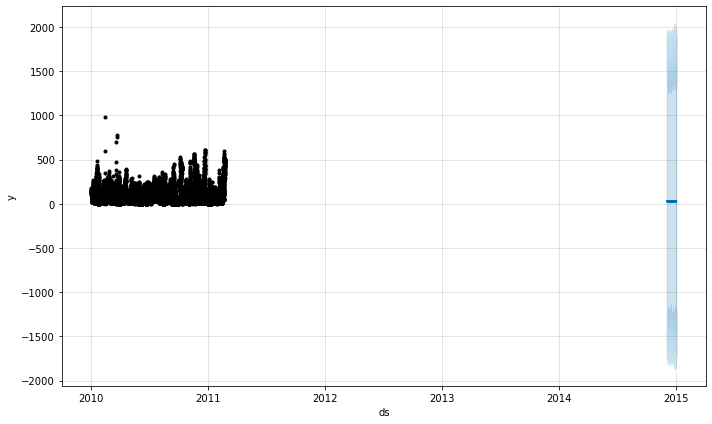

In [31]:
m.plot(forecast, uncertainty=True)
plt.show()

In [32]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

107.90212485864366

## 1 year

In [34]:
train, test = split(data, 24*365)
train1 = train.iloc[:1000]
train2 = train.iloc[:10000]

35040 8760


In [9]:
%%time
m=Prophet(seasonality_mode='multiplicative')
m.fit(train)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 3min 8s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-01-01 00:00:00,77.935535,-28.185936,195.618391,77.935535,77.935535,0.141028,0.141028,0.141028,0.122882,...,0.011653,0.011653,0.011653,-0.029799,-0.029799,-0.029799,0.0,0.0,0.0,87.512426
1,2014-01-01 01:00:00,77.930701,-26.444022,188.512620,77.930701,77.930701,0.135935,0.135935,0.135935,0.118442,...,0.010668,0.010668,0.010668,-0.028162,-0.028162,-0.028162,0.0,0.0,0.0,87.160938
2,2014-01-01 02:00:00,77.925868,-20.273321,197.847174,77.925868,77.925868,0.118574,0.118574,0.118574,0.101517,...,0.009462,0.009462,0.009462,-0.026519,-0.026519,-0.026519,0.0,0.0,0.0,85.836656
3,2014-01-01 03:00:00,77.921035,-40.192302,195.231464,77.921035,77.921035,0.086291,0.086291,0.086291,0.069467,...,0.008047,0.008047,0.008047,-0.024871,-0.024871,-0.024871,0.0,0.0,0.0,83.333941
4,2014-01-01 04:00:00,77.916201,-29.184754,186.386360,77.916201,77.916201,0.044893,0.044893,0.044893,0.028112,...,0.006436,0.006436,0.006436,-0.023217,-0.023217,-0.023217,0.0,0.0,0.0,80.106620


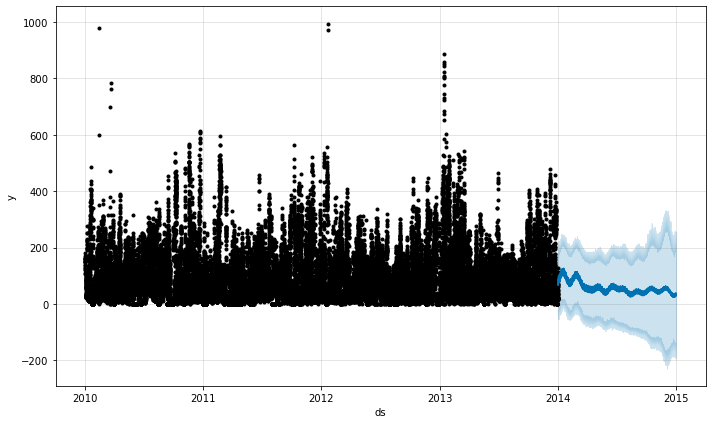

In [11]:
m.plot(forecast, uncertainty=True)
plt.show()

In [12]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

102.43068615202978

In [13]:
%%time
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=True)
m.fit(train1)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 2min 49s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-01-01 00:00:00,-426.296428,-3.754543e+06,3.777833e+06,-101828.784923,102460.748731,3.597942,3.597942,3.597942,35.871266,...,6.868918,6.868918,6.868918,25.404406,25.404406,25.404406,0.0,0.0,0.0,-15718.088893
1,2014-01-01 01:00:00,-426.309086,-3.685611e+06,3.708454e+06,-101829.963349,102463.145537,3.648026,3.648026,3.648026,35.193396,...,6.101013,6.101013,6.101013,25.444357,25.444357,25.444357,0.0,0.0,0.0,-15429.573373
2,2014-01-01 02:00:00,-426.321743,-3.571005e+06,3.593272e+06,-101831.141774,102465.542344,3.280838,3.280838,3.280838,34.067683,...,5.303022,5.303022,5.303022,25.483823,25.483823,25.483823,0.0,0.0,0.0,-14950.115752
3,2014-01-01 03:00:00,-426.334401,-3.377387e+06,3.398436e+06,-101832.320199,102467.939151,2.163679,2.163679,2.163679,32.165825,...,4.479343,4.479343,4.479343,25.522803,25.522803,25.522803,0.0,0.0,0.0,-14139.731989
4,2014-01-01 04:00:00,-426.347058,-3.124555e+06,3.144039e+06,-101833.498625,102470.335957,0.486960,0.486960,0.486960,29.682845,...,3.634588,3.634588,3.634588,25.561297,25.561297,25.561297,0.0,0.0,0.0,-13081.540835


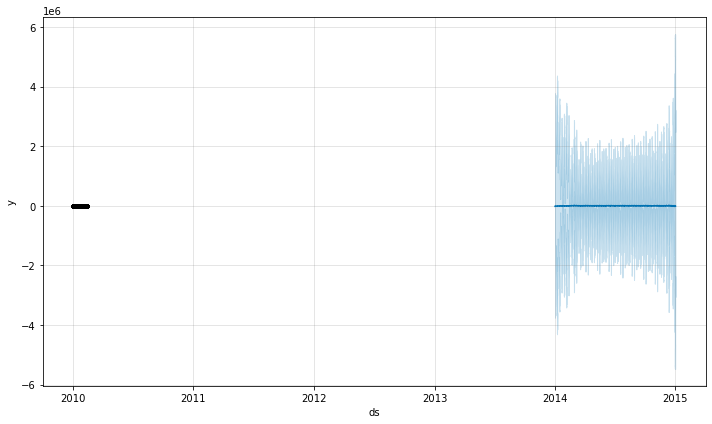

In [14]:
m.plot(forecast, uncertainty=True)
plt.show()

In [15]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

5366.822755499508

In [35]:
%%time
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=True)
m.fit(train2)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 57.5 s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-01-01 00:00:00,-103.746468,-1441.593485,1220.847795,-2772.460413,2391.285965,0.120475,0.120475,0.120475,-0.485357,...,0.048060,0.048060,0.048060,-0.653892,-0.653892,-0.653892,0.0,0.0,0.0,-53.392439
1,2014-01-01 01:00:00,-103.757677,-1355.412122,1237.531689,-2772.621292,2391.348105,0.115677,0.115677,0.115677,-0.492560,...,0.046686,0.046686,0.046686,-0.654922,-0.654922,-0.654922,0.0,0.0,0.0,-52.650813
2,2014-01-01 02:00:00,-103.768886,-1341.449936,1136.381150,-2772.782171,2391.410245,0.097520,0.097520,0.097520,-0.513367,...,0.045064,0.045064,0.045064,-0.655951,-0.655951,-0.655951,0.0,0.0,0.0,-50.497362
3,2014-01-01 03:00:00,-103.780095,-1263.309404,1074.562965,-2772.943050,2391.472385,0.065736,0.065736,0.065736,-0.548022,...,0.043220,0.043220,0.043220,-0.656978,-0.656978,-0.656978,0.0,0.0,0.0,-46.906339
4,2014-01-01 04:00:00,-103.791305,-1108.000564,964.141731,-2773.103929,2391.534524,0.026590,0.026590,0.026590,-0.590233,...,0.041180,0.041180,0.041180,-0.658004,-0.658004,-0.658004,0.0,0.0,0.0,-42.530234


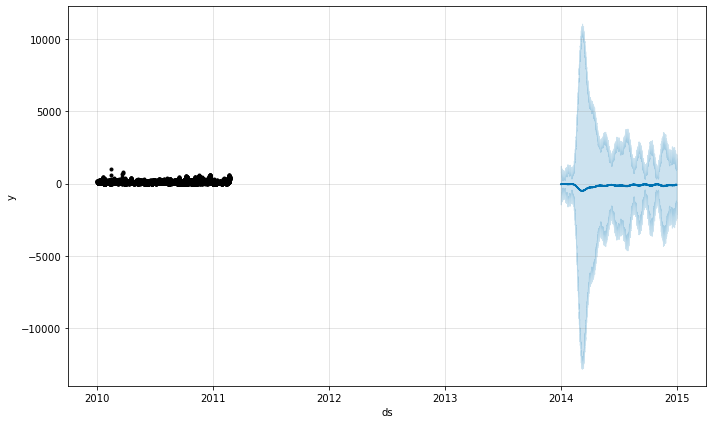

In [36]:
m.plot(forecast, uncertainty=True)
plt.show()

In [37]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

279.1253125379101

## 6 month

In [38]:
train, test = split(data, 6*30*24)
train1 = train.iloc[:1000]
train2 = train.iloc[:10000]

39480 4320


In [20]:
%%time
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=True)
m.fit(train)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 3min 49s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-07-05 00:00:00,98.128614,-2.040228,214.056635,98.128614,98.128614,0.139680,0.139680,0.139680,0.099368,...,0.035077,0.035077,0.035077,-0.075389,-0.075389,-0.075389,0.0,0.0,0.0,107.879473
1,2014-07-05 01:00:00,98.128929,-7.386073,229.178867,98.128929,98.128929,0.137430,0.137430,0.137430,0.098910,...,0.036864,0.036864,0.036864,-0.075384,-0.075384,-0.075384,0.0,0.0,0.0,107.834904
2,2014-07-05 02:00:00,98.129243,-5.730157,219.956192,98.129243,98.129243,0.122851,0.122851,0.122851,0.086089,...,0.038613,0.038613,0.038613,-0.075375,-0.075375,-0.075375,0.0,0.0,0.0,106.577080
3,2014-07-05 03:00:00,98.129558,-12.586054,212.372427,98.129558,98.129558,0.092307,0.092307,0.092307,0.057253,...,0.040310,0.040310,0.040310,-0.075364,-0.075364,-0.075364,0.0,0.0,0.0,103.747787
4,2014-07-05 04:00:00,98.129872,-16.333214,219.003344,98.129872,98.129872,0.051180,0.051180,0.051180,0.017770,...,0.041939,0.041939,0.041939,-0.075350,-0.075350,-0.075350,0.0,0.0,0.0,99.873592


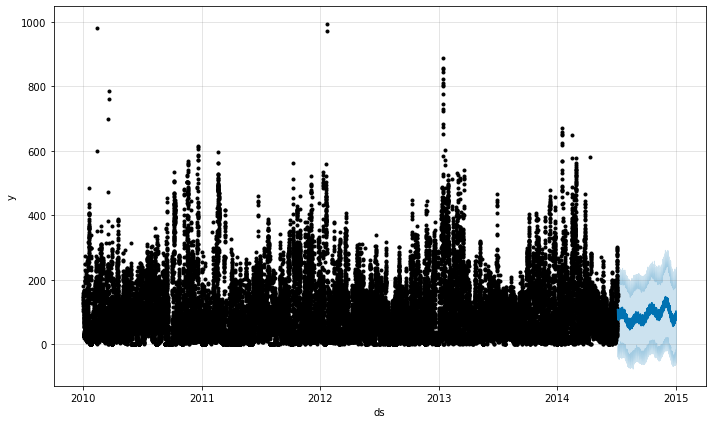

In [21]:
m.plot(forecast, uncertainty=True)
plt.show()

In [22]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

79.93445627786424

In [23]:
%%time
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=True)
m.fit(train1)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 1min 47s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-07-05 00:00:00,-482.496373,-43086.318384,37756.173981,-131820.058465,115655.900598,3.597942,3.597942,3.597942,-0.673377,...,-4.477784,-4.477784,-4.477784,0.206464,0.206464,0.206464,0.0,0.0,0.0,-157.594263
1,2014-07-05 01:00:00,-482.509031,-64852.891693,56910.959449,-131827.566133,115660.595937,3.648026,3.648026,3.648026,-0.508245,...,-4.361893,-4.361893,-4.361893,0.205623,0.205623,0.205623,0.0,0.0,0.0,-237.276444
2,2014-07-05 02:00:00,-482.521689,-32932.518879,28837.195293,-131835.074706,115665.291277,3.280838,3.280838,3.280838,-0.750317,...,-4.235782,-4.235782,-4.235782,0.204626,0.204626,0.204626,0.0,0.0,0.0,-120.477287
3,2014-07-05 03:00:00,-482.534346,-84570.528869,96441.202136,-131842.583279,115669.986617,2.163679,2.163679,2.163679,-1.731396,...,-4.098551,-4.098551,-4.098551,0.203476,0.203476,0.203476,0.0,0.0,0.0,352.923765
4,2014-07-05 04:00:00,-482.547004,-261502.343646,298012.420538,-131850.091853,115674.681957,0.486960,0.486960,0.486960,-3.260364,...,-3.949495,-3.949495,-3.949495,0.202171,0.202171,0.202171,0.0,0.0,0.0,1090.732092


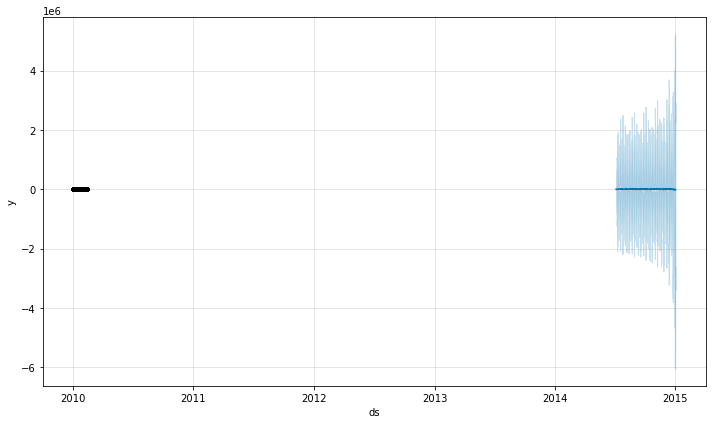

In [24]:
m.plot(forecast, uncertainty=True)
plt.show()

In [25]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

5105.7954171605725

In [39]:
%%time
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=True)
m.fit(train2)
# future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(test)
forecast.head()

Wall time: 52.4 s


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,multiplicative_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-07-05 00:00:00,-153.515652,-3595.856814,3229.781476,-3696.032556,3273.964786,0.120475,0.120475,0.120475,-0.013813,...,0.018383,0.018383,0.018383,-0.152671,-0.152671,-0.152671,0.0,0.0,0.0,-151.395158
1,2014-07-05 01:00:00,-153.526861,-3692.982053,3229.431997,-3696.076354,3274.109177,0.115677,0.115677,0.115677,-0.019437,...,0.018129,0.018129,0.018129,-0.153242,-0.153242,-0.153242,0.0,0.0,0.0,-150.542813
2,2014-07-05 02:00:00,-153.538071,-3529.958728,3138.917538,-3696.120151,3274.253569,0.097520,0.097520,0.097520,-0.038401,...,0.017890,0.017890,0.017890,-0.153811,-0.153811,-0.153811,0.0,0.0,0.0,-147.642032
3,2014-07-05 03:00:00,-153.549280,-3366.065408,3053.092813,-3696.163949,3274.397960,0.065736,0.065736,0.065736,-0.070978,...,0.017663,0.017663,0.017663,-0.154378,-0.154378,-0.154378,0.0,0.0,0.0,-142.650606
4,2014-07-05 04:00:00,-153.560489,-3289.255527,2936.496570,-3696.207747,3274.542352,0.026590,0.026590,0.026590,-0.110908,...,0.017444,0.017444,0.017444,-0.154943,-0.154943,-0.154943,0.0,0.0,0.0,-136.529348


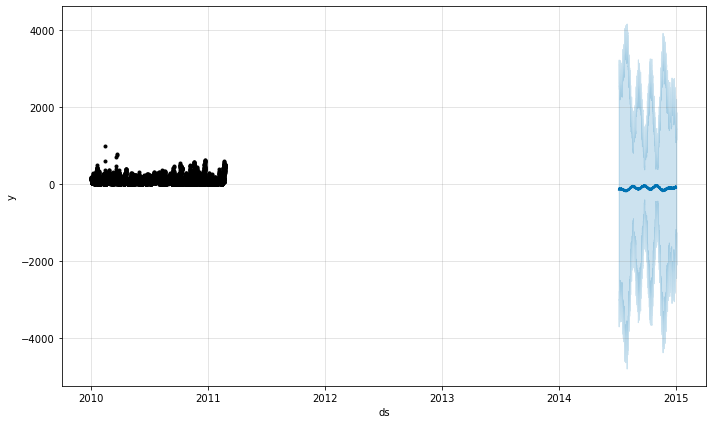

In [40]:
m.plot(forecast, uncertainty=True)
plt.show()

In [41]:
se = np.square(forecast.loc[:, 'yhat'] - data.loc[:,'y'])
mse = np.mean(se)
rmse = np.sqrt(mse)
rmse

212.17535472497988